<a href="https://www.kaggle.com/code/aliniazi3/spotcancerai?scriptVersionId=259789327" target="_blank"><img align="left" alt="Kaggle" title="Open in Kaggle" src="https://kaggle.com/static/images/open-in-kaggle.svg"></a>

In [1]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

/kaggle/input/skin-cancer-mnist-ham10000/hmnist_8_8_RGB.csv
/kaggle/input/skin-cancer-mnist-ham10000/hmnist_28_28_RGB.csv
/kaggle/input/skin-cancer-mnist-ham10000/hmnist_8_8_L.csv
/kaggle/input/skin-cancer-mnist-ham10000/hmnist_28_28_L.csv
/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_metadata.csv
/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_1/ISIC_0028933.jpg
/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_1/ISIC_0028394.jpg
/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_1/ISIC_0027799.jpg
/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_1/ISIC_0028100.jpg
/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_1/ISIC_0027960.jpg
/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_1/ISIC_0028872.jpg
/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_1/ISIC_0026412.jpg
/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_images_part_1/ISIC_0024872.jpg
/kaggle/input/skin-cancer-mnist-ham10000/HAM10000


# **Importing Libraries**

In [2]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
import itertools
import cv2
import tensorflow as tf

from glob import glob
from PIL import Image
from sklearn.model_selection import train_test_split
from tensorflow.keras.utils import to_categorical
from tensorflow.keras.regularizers import l2
from tensorflow.keras.preprocessing.image import ImageDataGenerator

# **DATA READING**

In [3]:
df = pd.read_csv('../input/skin-cancer-mnist-ham10000/HAM10000_metadata.csv')
df.head()

,lesion_id,image_id,dx,dx_type,age,sex,localization
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear


In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 10015 entries, 0 to 10014
Data columns (total 7 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   lesion_id     10015 non-null  object 
 1   image_id      10015 non-null  object 
 2   dx            10015 non-null  object 
 3   dx_type       10015 non-null  object 
 4   age           9958 non-null   float64
 5   sex           10015 non-null  object 
 6   localization  10015 non-null  object 
dtypes: float64(1), object(6)
memory usage: 547.8+ KB


In [5]:
df.shape

(10015, 7)

# **DATA Preprocessing**

**Creating dictionary for displaying more human-friendly labels.**

In [6]:
lesion_type_dict = {
    'akiec': 'Actinic keratoses',
    'bcc': 'Basal cell carcinoma',
    'bkl': 'Benign keratosis-like lesions',
    'df': 'Dermatofibroma',
    'nv': 'Melanocytic nevi',
    'vasc': 'Vascular lesions',
    'mel': 'Melanoma'
}
base_skin_dir = '../input/skin-cancer-mnist-ham10000'

# **Merge images from both folders into one dictionary**

In [7]:
imageid_path_dict = {os.path.splitext(os.path.basename(x))[0]: x
                     for x in glob(os.path.join(base_skin_dir, '*', '*.jpg'))}

# **Creating new columns for better understanding of features**

In [8]:
df['path'] = df['image_id'].map(imageid_path_dict.get)
df['cell_type'] = df['dx'].map(lesion_type_dict.get)
df['cell_type_idx'] = pd.Categorical(df['cell_type']).codes

df.head()

,lesion_id,image_id,dx,dx_type,age,sex,localization,path,cell_type,cell_type_idx
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp,../input/skin-cancer-mnist-ham10000/ham10000_i...,Benign keratosis-like lesions,2
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp,../input/skin-cancer-mnist-ham10000/ham10000_i...,Benign keratosis-like lesions,2
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp,../input/skin-cancer-mnist-ham10000/ham10000_i...,Benign keratosis-like lesions,2
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp,../input/skin-cancer-mnist-ham10000/ham10000_i...,Benign keratosis-like lesions,2
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear,../input/skin-cancer-mnist-ham10000/ham10000_i...,Benign keratosis-like lesions,2


⚙️ Preprocessing all images...


100%|██████████| 10015/10015 [04:37<00:00, 36.05it/s]


✅ Preprocessing complete. All processed images saved to: /kaggle/working/preprocessed_images


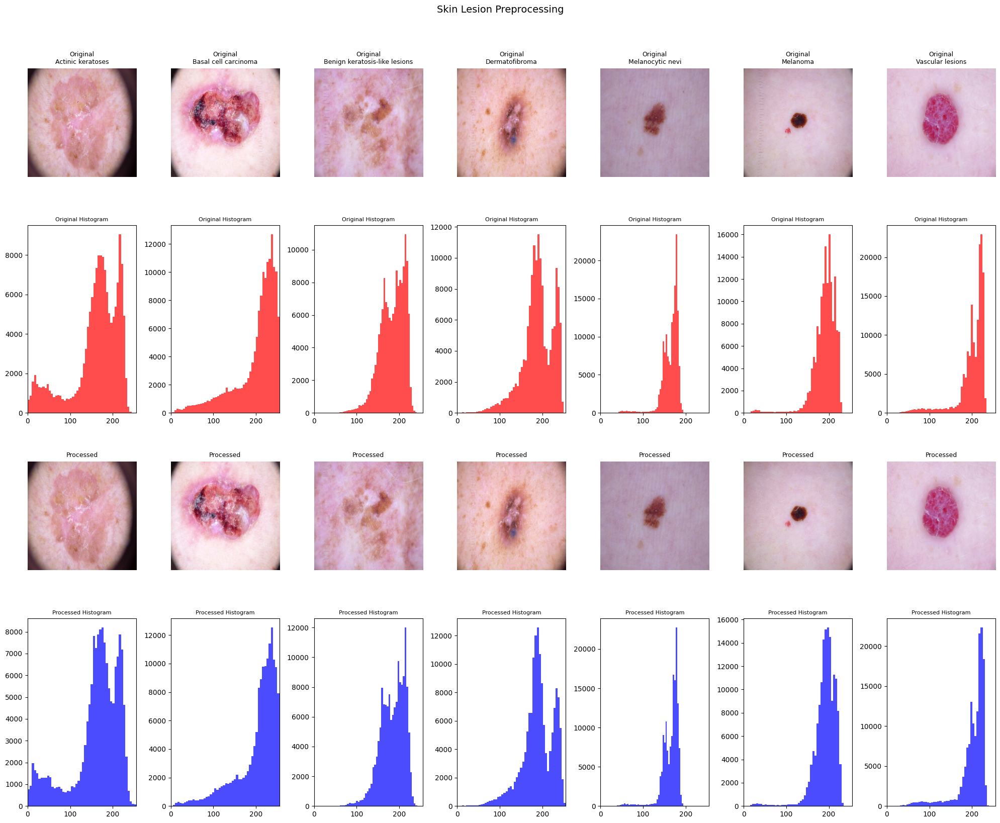

In [9]:
import os
import cv2
import matplotlib.pyplot as plt
import pandas as pd
from tqdm import tqdm

# -------------------------
# Preprocessing function
# -------------------------

def preprocess(input_img, IMAGE_SIZE=224):
    """
    Safe preprocessing for skin lesion images:
    - Removes only thin hairs
    - Keeps lesion quality intact
    - Resizes at the end
    """
    # Load image if path
    if isinstance(input_img, str):
        img = cv2.imread(input_img)
        if img is None:
            raise FileNotFoundError(f"Could not read image: {input_img}")
        img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    else:
        img = input_img
        if img.dtype != np.uint8:
            img = img.astype(np.uint8)

    # ---------------- Hair Removal ----------------
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # Use a small kernel to only pick up thin lines (hair)
    kernel = cv2.getStructuringElement(cv2.MORPH_CROSS, (9, 9))
    blackhat = cv2.morphologyEx(gray, cv2.MORPH_BLACKHAT, kernel)

    # Threshold only strong black lines
    _, hair_mask = cv2.threshold(blackhat, 15, 255, cv2.THRESH_BINARY)

    # Inpaint ONLY the detected hair pixels
    cleaned = cv2.inpaint(img, hair_mask, 1, cv2.INPAINT_TELEA)

    # ---------------- Resize (after cleaning) ----------------
    cleaned_resized = cv2.resize(cleaned, (IMAGE_SIZE, IMAGE_SIZE), interpolation=cv2.INTER_LANCZOS4)

    return cleaned_resized

# -------------------------
# Step 1: Preprocess full dataset and save
# -------------------------
output_dir = "/kaggle/working/preprocessed_images"
os.makedirs(output_dir, exist_ok=True)

processed_paths = []

print("⚙️ Preprocessing all images...")
for row in tqdm(df.itertuples(), total=len(df)):
    processed = preprocess(row.path)
    
    # Save processed image
    filename = os.path.basename(row.path)
    save_path = os.path.join(output_dir, filename)
    cv2.imwrite(save_path, cv2.cvtColor(processed, cv2.COLOR_RGB2BGR))  # save in BGR
    
    processed_paths.append(save_path)

# Add new column to dataframe
df["processed_path"] = processed_paths
print("✅ Preprocessing complete. All processed images saved to:", output_dir)


# -------------------------
# Step 2: Visualization (7 samples, one per class)
# -------------------------
sample_images = df.groupby('cell_type').first().reset_index()

plt.figure(figsize=(20, 16))

for i, row in enumerate(sample_images.itertuples(), 1):
    if i > 7: break
    
    # Original image
    original = cv2.imread(row.path)
    original = cv2.resize(original, (224, 224))
    original_rgb = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)
    
    # Processed image
    processed = cv2.imread(row.processed_path)
    processed = cv2.resize(processed, (224, 224))
    processed_rgb = cv2.cvtColor(processed, cv2.COLOR_BGR2RGB)
    
    # Plotting
    plt.subplot(4, 7, i)
    plt.imshow(original_rgb)
    plt.title(f"Original\n{row.cell_type}", fontsize=9)
    plt.axis('off')
    
    plt.subplot(4, 7, i+7)
    plt.hist(original_rgb.ravel(), bins=50, color='red', alpha=0.7)
    plt.title("Original Histogram", fontsize=8)
    plt.xlim(0, 255)
    
    plt.subplot(4, 7, i+14)
    plt.imshow(processed_rgb)
    plt.title("Processed", fontsize=9)
    plt.axis('off')
    
    plt.subplot(4, 7, i+21)
    plt.hist(processed_rgb.ravel(), bins=50, color='blue', alpha=0.7)
    plt.title("Processed Histogram", fontsize=8)
    plt.xlim(0, 255)

plt.tight_layout()
plt.suptitle("Skin Lesion Preprocessing", y=1.02, fontsize=14)
plt.show()


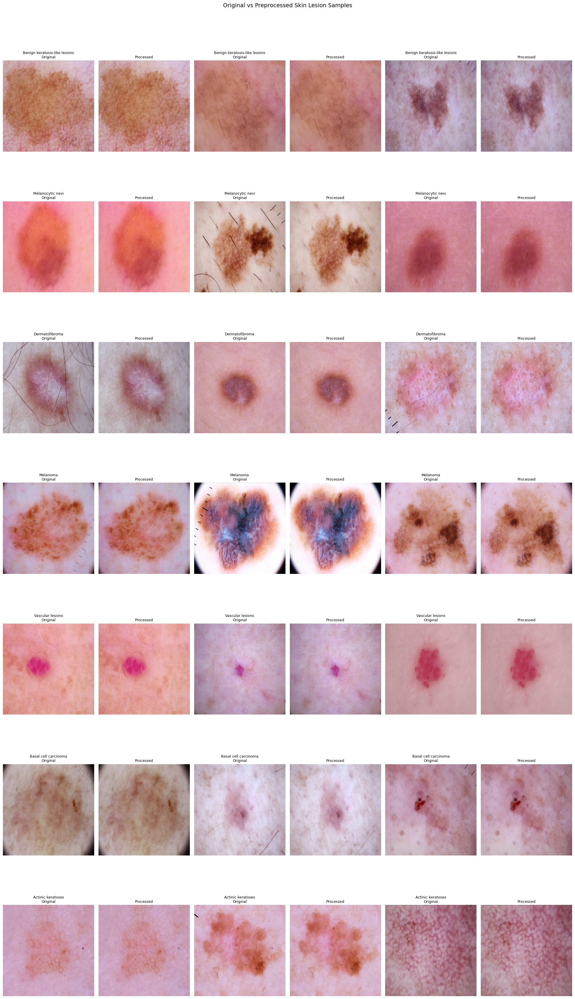

In [10]:
# -------------------------
# Step 2: Visualization (Show multiple samples per class)
# -------------------------
n_samples = 3  # number of images per class to show
classes = df['cell_type'].unique()

plt.figure(figsize=(20, len(classes) * 5))

for class_idx, cell_type in enumerate(classes):
    # Pick n random samples from each class
    samples = df[df['cell_type'] == cell_type].sample(n=min(n_samples, len(df[df['cell_type'] == cell_type])), random_state=42)
    
    for i, row in enumerate(samples.itertuples(), 1):
        # Original image
        original = cv2.imread(row.path)
        original = cv2.resize(original, (224, 224))
        original_rgb = cv2.cvtColor(original, cv2.COLOR_BGR2RGB)

        # Processed image
        processed = cv2.imread(row.processed_path)
        processed = cv2.resize(processed, (224, 224))
        processed_rgb = cv2.cvtColor(processed, cv2.COLOR_BGR2RGB)

        # Plot Original
        plt.subplot(len(classes), n_samples*2, class_idx*n_samples*2 + (i*2-1))
        plt.imshow(original_rgb)
        plt.title(f"{cell_type}\nOriginal", fontsize=9)
        plt.axis('off')

        # Plot Processed
        plt.subplot(len(classes), n_samples*2, class_idx*n_samples*2 + i*2)
        plt.imshow(processed_rgb)
        plt.title("Processed", fontsize=9)
        plt.axis('off')

plt.tight_layout()
plt.suptitle("Original vs Preprocessed Skin Lesion Samples", y=1.02, fontsize=14)
plt.show()


In [11]:
tabular_data = pd.read_csv('/kaggle/input/skin-cancer-mnist-ham10000/HAM10000_metadata.csv')
tabular_data.head()

,lesion_id,image_id,dx,dx_type,age,sex,localization
0,HAM_0000118,ISIC_0027419,bkl,histo,80.0,male,scalp
1,HAM_0000118,ISIC_0025030,bkl,histo,80.0,male,scalp
2,HAM_0002730,ISIC_0026769,bkl,histo,80.0,male,scalp
3,HAM_0002730,ISIC_0025661,bkl,histo,80.0,male,scalp
4,HAM_0001466,ISIC_0031633,bkl,histo,75.0,male,ear


# **Exploratory Data Analysis (EDA)**

In [12]:
tabular_data.columns

Index(['lesion_id', 'image_id', 'dx', 'dx_type', 'age', 'sex', 'localization'], dtype='object')

# **Frequency Distribution of Classes**

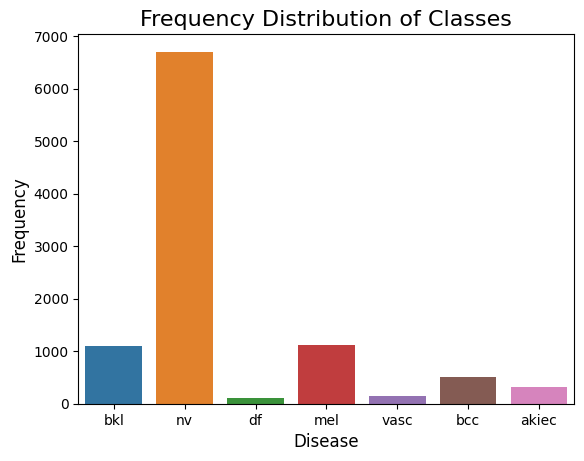

In [13]:
sns.countplot(x = 'dx', data = tabular_data)
plt.xlabel('Disease', size=12)
plt.ylabel('Frequency', size=12)
plt.title('Frequency Distribution of Classes', size=16)
plt.show()

# **Distribution of Disease over Gender**

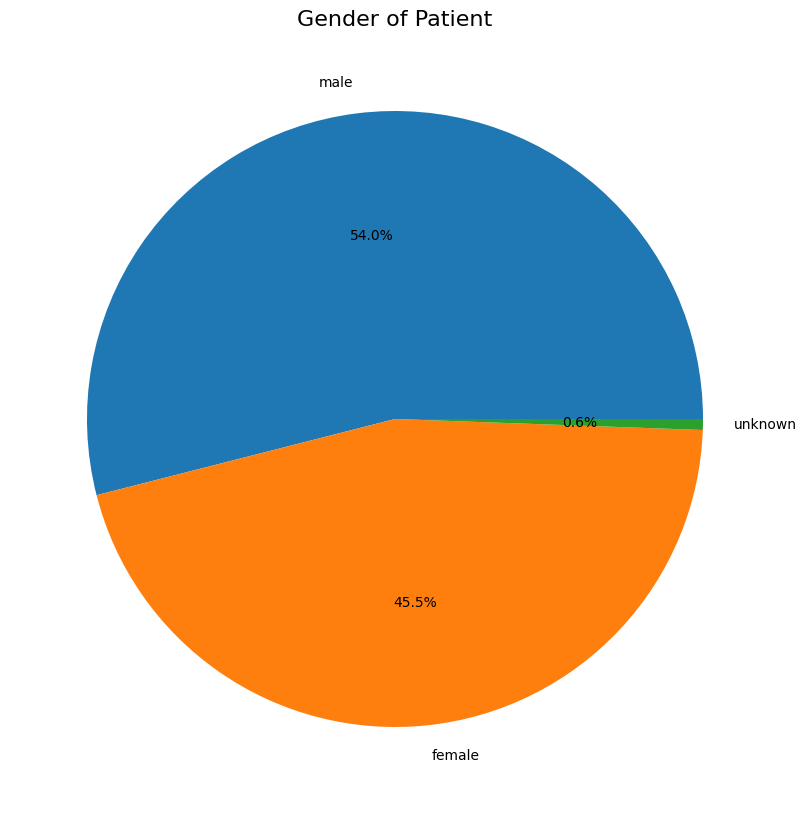

In [14]:
bar, ax = plt.subplots(figsize = (10,10))
plt.pie(tabular_data['sex'].value_counts(), labels = tabular_data['sex'].value_counts().index, autopct="%.1f%%")
plt.title('Gender of Patient', size=16)
plt.show()

# **Histogram of Age of Patients**

/usr/local/lib/python3.10/dist-packages/seaborn/_oldcore.py:1119: FutureWarning: use_inf_as_na option is deprecated and will be removed in a future version. Convert inf values to NaN before operating instead.
  with pd.option_context('mode.use_inf_as_na', True):


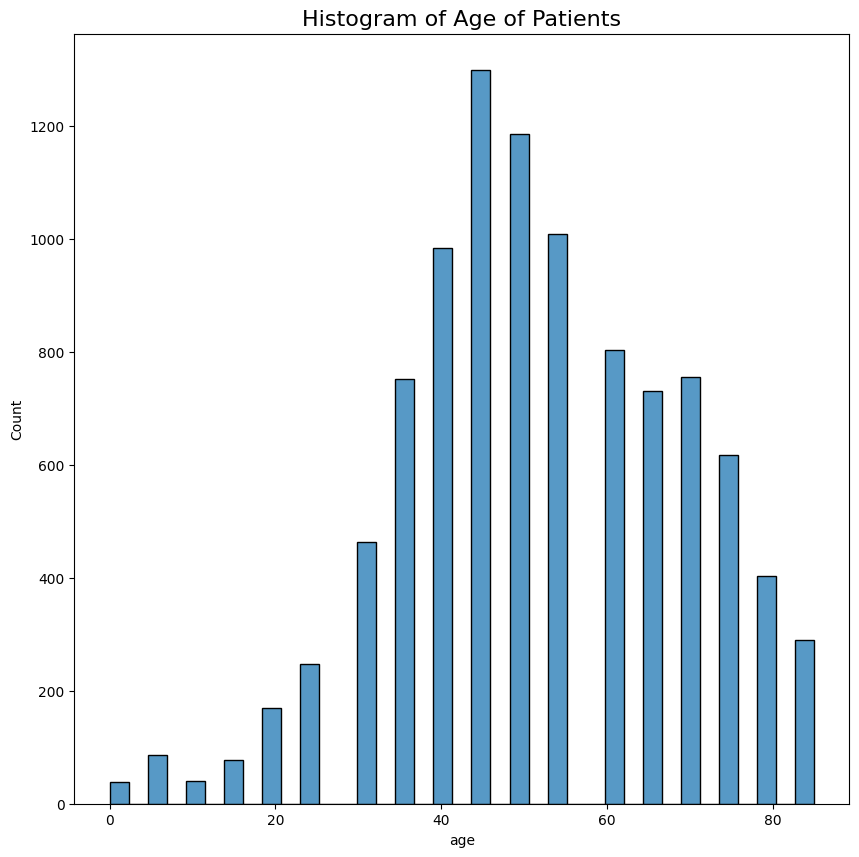

In [15]:
bar, ax = plt.subplots(figsize=(10,10))
sns.histplot(tabular_data['age'])
plt.title('Histogram of Age of Patients', size=16)
plt.show()

# **Location of disease over Gender**

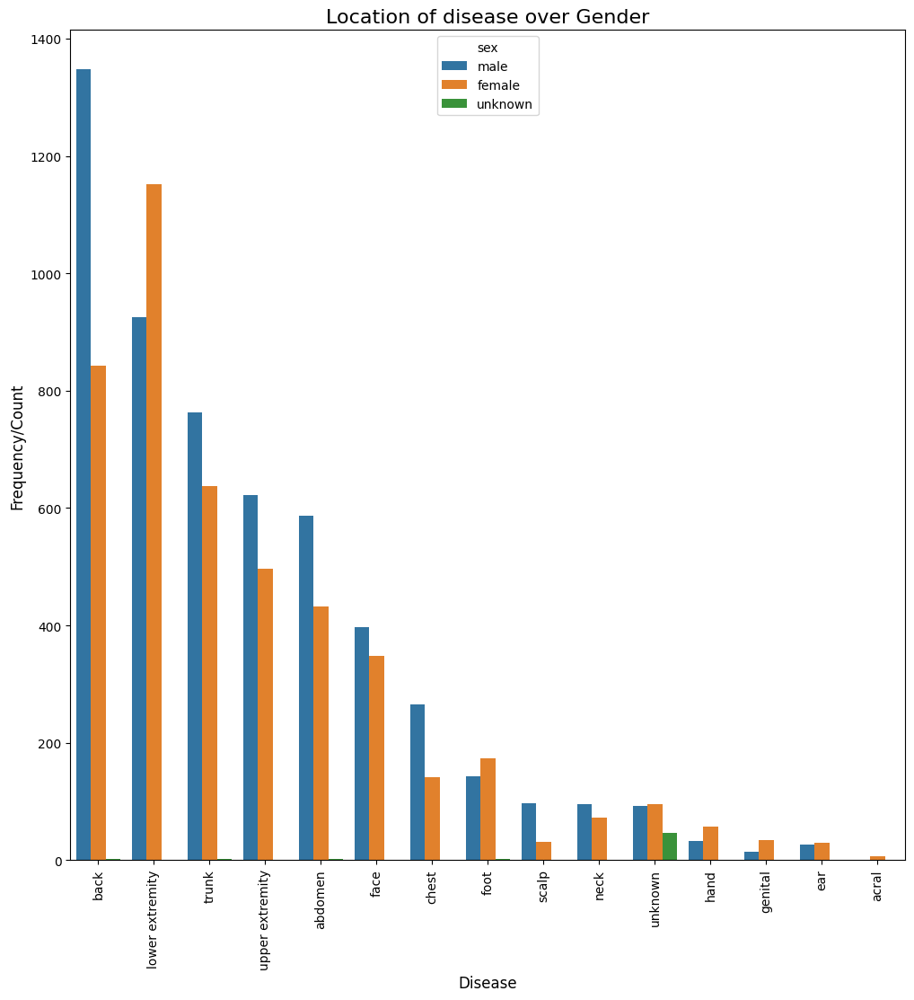

In [16]:
value = tabular_data[['localization', 'sex']].value_counts().to_frame()
value.reset_index(level=[1,0 ], inplace=True)
temp = value.rename(columns = {'localization':'location', 0: 'count'})

bar, ax = plt.subplots(figsize = (12, 12))
sns.barplot(x = 'location',  y='count', hue = 'sex', data = temp)
plt.title('Location of disease over Gender', size = 16)
plt.xlabel('Disease', size=12)
plt.ylabel('Frequency/Count', size=12)
plt.xticks(rotation = 90)
plt.show()

# **Data Splitting**

In [17]:
X = df['path'].values
y = df['dx'].values
from sklearn.model_selection import train_test_split

# 1. 70% train, 30% temp (val + test)
X_train, X_temp, y_train, y_temp = train_test_split(
    X, y, test_size=0.3, stratify=y, random_state=42)

# 2. Split temp into 10% val and 20% test (from original data)
X_val, X_test, y_val, y_test = train_test_split(
    X_temp, y_temp, test_size=2/3, stratify=y_temp, random_state=42)

print(f"Train size: {len(X_train)} ({len(X_train)/len(X):.2%})")
print(f"Validation size: {len(X_val)} ({len(X_val)/len(X):.2%})")
print(f"Test size: {len(X_test)} ({len(X_test)/len(X):.2%})")


Train size: 7010 (70.00%)
Validation size: 1001 (10.00%)
Test size: 2004 (20.01%)


# **Combine into DataFrames**

In [18]:
train_df = pd.DataFrame({'path': X_train, 'label': y_train})
val_df   = pd.DataFrame({'path': X_val,   'label': y_val})
test_df  = pd.DataFrame({'path': X_test,  'label': y_test})

# Convert labels to string for generators
for d in [train_df, val_df, test_df]:
    d['label'] = d['label'].astype(str)

# -------------------
# Map to preprocessed path
# -------------------
preprocessed_dir = "/kaggle/working/preprocessed_images"

for d in [train_df, val_df, test_df]:
    d['processed_path'] = d['path'].apply(lambda x: os.path.join(preprocessed_dir, os.path.basename(x)))

# ✅ Now use `processed_path` column for your generators
print("Example preprocessed path:", train_df['processed_path'].iloc[0])

Example preprocessed path: /kaggle/working/preprocessed_images/ISIC_0031775.jpg


# **Augmentation**

In [19]:
class_counts = train_df['label'].value_counts()
max_count = class_counts.max()
print("Original class distribution:\n", class_counts)

Original class distribution:
 label
nv       4693
mel       779
bkl       769
bcc       360
akiec     229
vasc       99
df         81
Name: count, dtype: int64


In [20]:
import os
import uuid
import numpy as np
import pandas as pd
from tensorflow.keras.preprocessing.image import load_img, img_to_array, ImageDataGenerator, array_to_img

# -----------------------------
# Constants
# -----------------------------
IMAGE_SIZE = 224   # bigger size for final training
augmented_dir = "/kaggle/working/augmented_dataset"
os.makedirs(augmented_dir, exist_ok=True)

# -----------------------------
# Step 1: Count class samples
# -----------------------------
class_counts = train_df['label'].value_counts()
max_count = class_counts.max()
majority_class = class_counts.idxmax()
print(f"Majority class: '{majority_class}' with {max_count} images.\n")

# -----------------------------
# Step 2: Define Augmentation Generator
# -----------------------------
datagen = ImageDataGenerator(
    rotation_range=15,            
    width_shift_range=0.05,      
    height_shift_range=0.05,     
    zoom_range=0.15,             
    shear_range=0.1,              
    horizontal_flip=True,         
    vertical_flip=False,        
    brightness_range=[0.8, 1.2],  
    channel_shift_range=20,       
    fill_mode="reflect"           
)

# -----------------------------
# Step 3: Augment Minority Classes
# -----------------------------
augmented_records = []

for label in class_counts.index:
    if label == majority_class:
        print(f"Skipping augmentation for majority class '{label}'.\n")
        continue

    class_df = train_df[train_df['label'] == label]
    current_count = len(class_df)
    n_needed = max_count - current_count
    print(f"Augmenting class '{label}' → need {n_needed} extra images...")

    class_folder = os.path.join(augmented_dir, label)
    os.makedirs(class_folder, exist_ok=True)

    # Loop over existing images to generate more
    generated = 0
    while generated < n_needed:
        for _, row in class_df.iterrows():
            img = load_img(row['processed_path'], target_size=(IMAGE_SIZE, IMAGE_SIZE))
            x = img_to_array(img)
            x = np.expand_dims(x, 0)

            aug_iter = datagen.flow(x, batch_size=1)
            aug_img = next(aug_iter)[0].astype(np.uint8)

            out_filename = f"{uuid.uuid4().hex}.jpg"
            out_path = os.path.join(class_folder, out_filename)
            array_to_img(aug_img).save(out_path)

            augmented_records.append({'path': out_path, 'label': label})
            generated += 1
            if generated >= n_needed:
                break

print("✅ Classical augmentation completed on preprocessed images.")

# -----------------------------
# Step 4: Create Final Balanced Dataframe
# -----------------------------
augmented_df = pd.DataFrame(augmented_records)
balanced_train_df = pd.concat([train_df, augmented_df], ignore_index=True)

print("Final class distribution:\n", balanced_train_df['label'].value_counts())


Majority class: 'nv' with 4693 images.

Skipping augmentation for majority class 'nv'.

Augmenting class 'mel' → need 3914 extra images...
Augmenting class 'bkl' → need 3924 extra images...
Augmenting class 'bcc' → need 4333 extra images...
Augmenting class 'akiec' → need 4464 extra images...
Augmenting class 'vasc' → need 4594 extra images...
Augmenting class 'df' → need 4612 extra images...
✅ Classical augmentation completed on preprocessed images.
Final class distribution:
 label
nv       4693
mel      4693
df       4693
bkl      4693
akiec    4693
vasc     4693
bcc      4693
Name: count, dtype: int64


In [21]:
import shutil

# -----------------------------
# Step 5: Create ZIP of Augmented Dataset
# -----------------------------
zip_file_path = "/kaggle/working/augmented_dataset.zip"

if os.path.exists(augmented_dir):
    shutil.make_archive(zip_file_path.replace(".zip", ""), 'zip', augmented_dir)
    print(f"📦 Augmented dataset zipped at: {zip_file_path}")
else:
    print("❌ Augmented directory not found, skipping zipping.")


📦 Augmented dataset zipped at: /kaggle/working/augmented_dataset.zip


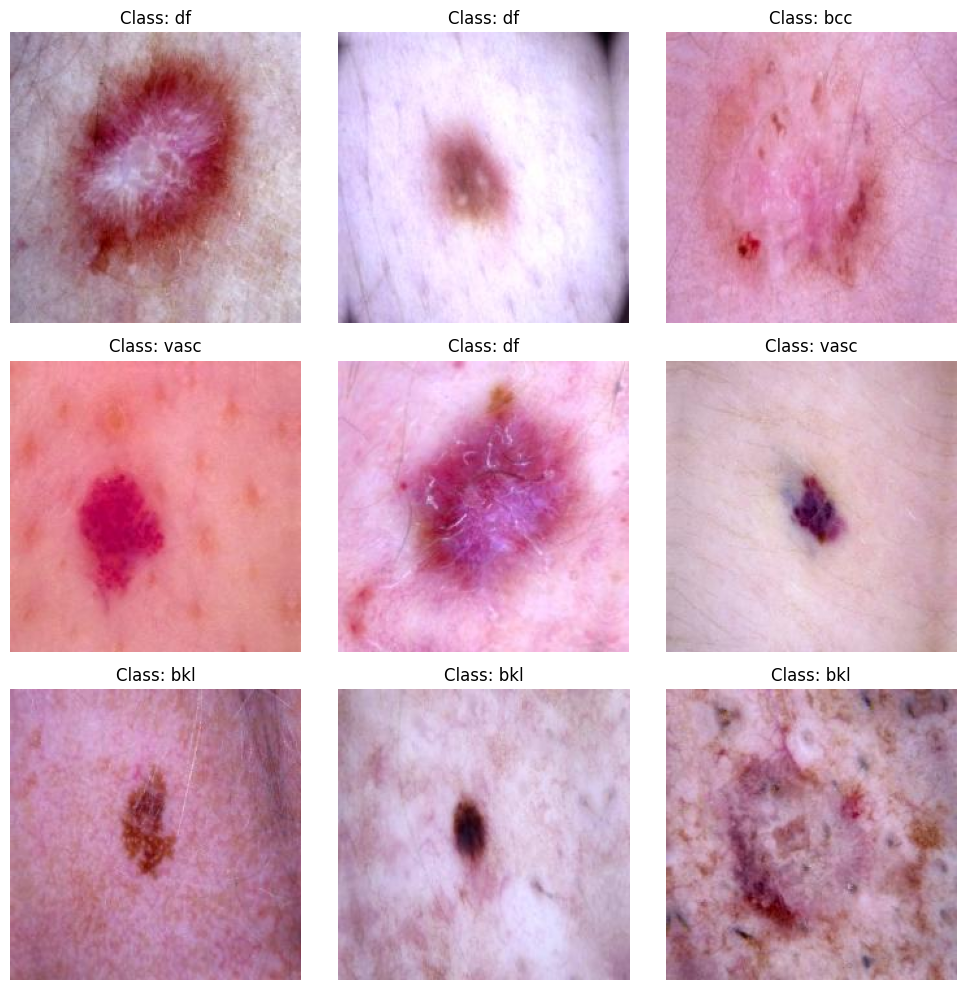

In [22]:
import matplotlib.pyplot as plt
import random

# Pick 9 random augmented images to show
sample_aug = augmented_df.sample(n=9, random_state=42)

plt.figure(figsize=(10, 10))
for i, row in enumerate(sample_aug.itertuples(), 1):
    img = load_img(row.path, target_size=(IMAGE_SIZE, IMAGE_SIZE))
    plt.subplot(3, 3, i)
    plt.imshow(img)
    plt.title(f"Class: {row.label}")
    plt.axis("off")

plt.tight_layout()
plt.show()

<ipython-input-23-dbedade397b0>:39: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from current font.
  plt.tight_layout()
/usr/local/lib/python3.10/dist-packages/IPython/core/pylabtools.py:151: UserWarning: Glyph 128202 (\N{BAR CHART}) missing from current font.
  fig.canvas.print_figure(bytes_io, **kw)


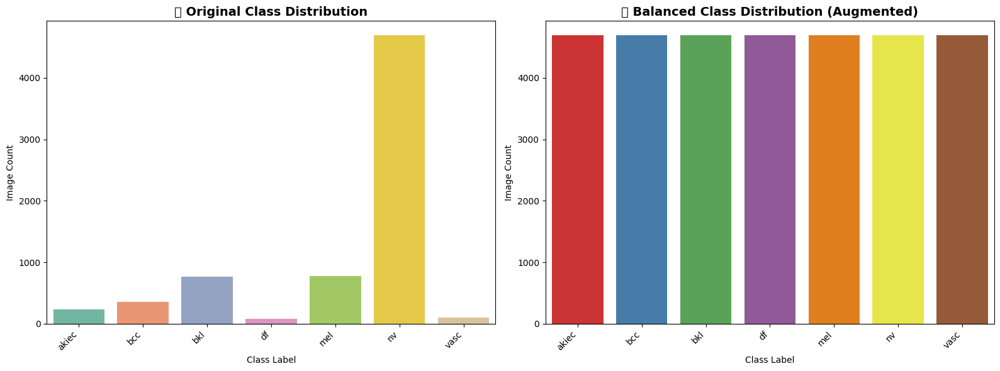

In [23]:
import matplotlib.pyplot as plt
import seaborn as sns

# -----------------------------
# Step 4: Compare distributions
# -----------------------------

# Ensure consistent class order across plots
class_order = sorted(train_df['label'].unique())

plt.figure(figsize=(16, 6))

# --- Plot 1: Original Data Distribution ---
plt.subplot(1, 2, 1)
sns.countplot(
    data=train_df,
    x='label',
    order=class_order,
    palette="Set2"
)
plt.title("📊 Original Class Distribution", fontsize=14, weight="bold")
plt.xlabel("Class Label")
plt.ylabel("Image Count")
plt.xticks(rotation=45, ha="right")

# --- Plot 2: Balanced Data Distribution ---
plt.subplot(1, 2, 2)
sns.countplot(
    data=balanced_train_df,
    x='label',
    order=class_order,
    palette="Set1"
)
plt.title("📊 Balanced Class Distribution (Augmented)", fontsize=14, weight="bold")
plt.xlabel("Class Label")
plt.ylabel("Image Count")
plt.xticks(rotation=45, ha="right")

plt.tight_layout()
plt.show()


# **One-hot encode the labels And Data Generators (for categorical classification)**

In [25]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import tensorflow as tf

train_df = train_df.copy()
train_df['path'] = train_df['processed_path']
balanced_train_df = pd.concat([train_df[['path','label']], augmented_df[['path','label']]], ignore_index=True)
val_df['label'] = val_df['label'].astype(str)
test_df['label'] = test_df['label'].astype(str)

IMAGE_SIZE = 224
BATCH_SIZE = 32
SEED = 42

# Data augmentation for training
train_datagen = ImageDataGenerator(
    rescale=1./255,
    rotation_range=15,            
    width_shift_range=0.05,      
    height_shift_range=0.05,     
    zoom_range=0.15,             
    shear_range=0.1,              
    horizontal_flip=True,         
    vertical_flip=False,        
    brightness_range=[0.8, 1.2],  
    channel_shift_range=20,       
    fill_mode="reflect"           
)


# Validation & Test just rescale
val_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

# ✅ Train on balanced augmented dataset
train_generator = train_datagen.flow_from_dataframe(
    dataframe=balanced_train_df,
    x_col='path',       # augmented dataset column
    y_col='label',
    target_size=(IMAGE_SIZE, IMAGE_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=True,
    seed=SEED
)

# ✅ Validation on original preprocessed dataset
val_generator = val_datagen.flow_from_dataframe(
    dataframe=val_df,
    x_col='processed_path',   # preprocessed column
    y_col='label',
    target_size=(IMAGE_SIZE, IMAGE_SIZE),
    batch_size=BATCH_SIZE,
    class_mode='categorical',
    shuffle=False,
    seed=SEED
)

# ✅ Test on original preprocessed dataset
test_generator = test_datagen.flow_from_dataframe(
    dataframe=test_df,
    x_col='processed_path',   # preprocessed column
    y_col='label',
    target_size=(IMAGE_SIZE, IMAGE_SIZE),
    batch_size=1,
    class_mode='categorical',
    shuffle=False,
    seed=SEED
)

print("Train classes:", train_generator.class_indices)
print("Train samples:", train_generator.samples)
print("Validation samples:", val_generator.samples)
print("Test samples:", test_generator.samples)


Found 32851 validated image filenames belonging to 7 classes.
Found 1001 validated image filenames belonging to 7 classes.
Found 2004 validated image filenames belonging to 7 classes.
Train classes: {'akiec': 0, 'bcc': 1, 'bkl': 2, 'df': 3, 'mel': 4, 'nv': 5, 'vasc': 6}
Train samples: 32851
Validation samples: 1001
Test samples: 2004


# **Build and compile the EfficientNetB5 model**

In [28]:
from tensorflow.keras.applications import EfficientNetB1
from tensorflow.keras.layers import GlobalAveragePooling2D, Dropout, Dense, BatchNormalization
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.regularizers import l2

# Define image size for EfficientNetB5
IMAGE_SIZE = 224  
BATCH_SIZE = 16
num_classes = 7

# Load EfficientNetB5 without top layer
base_model = EfficientNetB1(weights='imagenet', include_top=False, input_shape=(IMAGE_SIZE, IMAGE_SIZE, 3))

# ✅ Freeze the first 100 layers
for layer in base_model.layers[:10]:
    layer.trainable = False
for layer in base_model.layers[10:]:
    layer.trainable = True

# Custom classification head
x = base_model.output
x = GlobalAveragePooling2D()(x)
x = Dropout(0.5)(x)

x = Dense(256, activation='relu', kernel_regularizer=l2(0.0001))(x)
x = BatchNormalization()(x)

x = Dropout(0.3)(x)
x = Dense(128, activation='relu', kernel_regularizer=l2(0.0001))(x)
x = BatchNormalization()(x)

x = Dropout(0.2)(x)
output = Dense(num_classes, activation='softmax')(x)

model = Model(inputs=base_model.input, outputs=output)

# Compile
model.compile(optimizer=Adam(learning_rate=1e-5), 
              loss='categorical_crossentropy', 
              metrics=['accuracy'])

# Print model summary
model.summary()

Model: "functional_1"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer_1             │ (None, 224, 224, 3)    │              0 │ -                      │
│ (InputLayer)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling_2 (Rescaling)   │ (None, 224, 224, 3)    │              0 │ input_layer_1[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ normalization_1           │ (None, 224, 224, 3)    │              7 │ rescaling_2[0][0]      │
│ (Normalization)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ rescaling_3 (Rescaling)   │ (None, 224, 224, 3)    │              0 │ normalization_1[0][0]  │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv_pad             │ (None, 225, 225, 3)    │              0 │ rescaling_3[0][0]      │
│ (ZeroPadding2D)           │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_conv (Conv2D)        │ (None, 112, 112, 32)   │            864 │ stem_conv_pad[0][0]    │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_bn                   │ (None, 112, 112, 32)   │            128 │ stem_conv[0][0]        │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ stem_activation           │ (None, 112, 112, 32)   │              0 │ stem_bn[0][0]          │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_dwconv            │ (None, 112, 112, 32)   │            288 │ stem_activation[0][0]  │
│ (DepthwiseConv2D)         │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_bn                │ (None, 112, 112, 32)   │            128 │ block1a_dwconv[0][0]   │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_activation        │ (None, 112, 112, 32)   │              0 │ block1a_bn[0][0]       │
│ (Activation)              │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_squeeze        │ (None, 32)             │              0 │ block1a_activation[0]… │
│ (GlobalAveragePooling2D)  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reshape        │ (None, 1, 1, 32)       │              0 │ block1a_se_squeeze[0]… │
│ (Reshape)                 │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ block1a_se_reduce         │ (None, 1, 1, 8)        │            264 │ block1a_se_reshape[0]… │
│ (Conv2D)                  │                        │                │                        │
├──────────────────────

 Total params: 6,938,510 (26.47 MB)

 Trainable params: 6,874,407 (26.22 MB)

 Non-trainable params: 64,103 (250.41 KB)

# **Train the model**

In [29]:
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
import warnings
warnings.filterwarnings("ignore")
early_stop = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', patience=2, factor=0.5, min_lr=1e-7)

# Train the model
history = model.fit(
    train_generator,
    validation_data=val_generator,
    epochs=20,
    callbacks=[early_stop, reduce_lr]
)

Epoch 1/20
1027/1027 ━━━━━━━━━━━━━━━━━━━━ 598s 491ms/step - accuracy: 0.1971 - loss: 2.6137 - val_accuracy: 0.6344 - val_loss: 1.2147 - learning_rate: 1.0000e-05
Epoch 2/20
1027/1027 ━━━━━━━━━━━━━━━━━━━━ 425s 410ms/step - accuracy: 0.3242 - loss: 2.0789 - val_accuracy: 0.6583 - val_loss: 1.2439 - learning_rate: 1.0000e-05
Epoch 3/20
1027/1027 ━━━━━━━━━━━━━━━━━━━━ 420s 406ms/step - accuracy: 0.3818 - loss: 1.8544 - val_accuracy: 0.6743 - val_loss: 1.2011 - learning_rate: 1.0000e-05
Epoch 4/20
1027/1027 ━━━━━━━━━━━━━━━━━━━━ 421s 407ms/step - accuracy: 0.4325 - loss: 1.6786 - val_accuracy: 0.6773 - val_loss: 1.1634 - learning_rate: 1.0000e-05
Epoch 5/20
1027/1027 ━━━━━━━━━━━━━━━━━━━━ 421s 407ms/step - accuracy: 0.4661 - loss: 1.5528 - val_accuracy: 0.6743 - val_loss: 1.3452 - learning_rate: 1.0000e-05
Epoch 6/20
1027/1027 ━━━━━━━━━━━━━━━━━━━━ 421s 407ms/step - accuracy: 0.5133 - loss: 1.4237 - val_accuracy: 0.6843 - val_loss: 1.3626 - learning_rate: 1.0000e-05
Epoch 7/20
1027/1027 ━━━━━━━

In [30]:
# Example: Find epoch with the highest validation accuracy
best_epoch = np.argmax(history.history['accuracy']) + 1  # +1 because indexing starts from 0
best_acc = history.history['accuracy'][best_epoch - 1]

print(f"Best Epoch: {best_epoch}")
print(f"Accuracy at Best Epoch: {best_acc:.4f}")

Best Epoch: 20
Accuracy at Best Epoch: 0.6536


In [ ]:
import os

# Create directory
save_dir = '/kaggle/working/my_model'
os.makedirs(save_dir, exist_ok=True)

# Save model 
model.save(os.path.join(save_dir, 'Final_Model.h5'))

# **Plot Training History (Accuracy & Loss)**

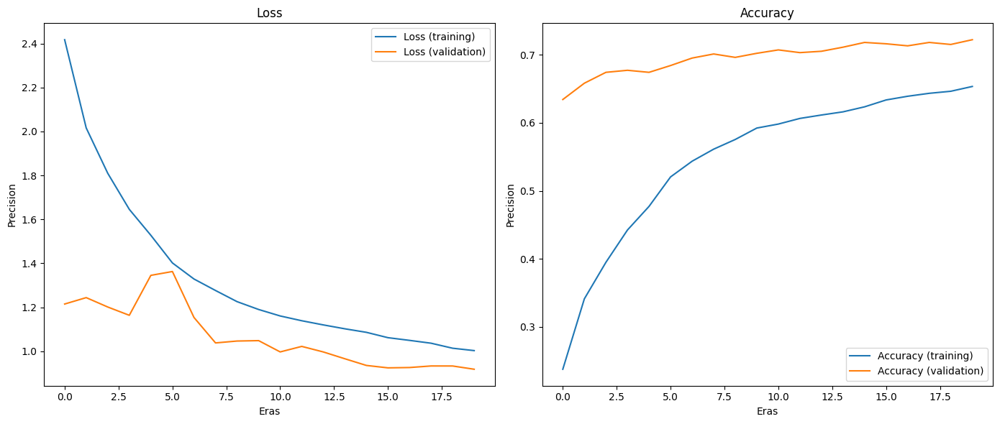

In [31]:
# Training curve
plt.figure(figsize=(14, 6))

# Loss curve
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Loss (training)')
plt.plot(history.history['val_loss'], label='Loss (validation)')
plt.title('Loss')
plt.xlabel('Eras')
plt.ylabel('Precision')
plt.legend()

# Precision curve
plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Accuracy (training)')
plt.plot(history.history['val_accuracy'], label='Accuracy (validation)')
plt.title('Accuracy')
plt.xlabel('Eras')
plt.ylabel('Precision')
plt.legend()

plt.tight_layout()
plt.show()


# **Evaluate the Model on Test Data**

In [32]:
loss, accuracy = model.evaluate(test_generator)
print(f"Test Loss: {loss:.4f}")
print(f"Test Accuracy: {accuracy:.4f}")

2004/2004 ━━━━━━━━━━━━━━━━━━━━ 21s 7ms/step - accuracy: 0.7385 - loss: 0.8422
Test Loss: 0.8881
Test Accuracy: 0.7206


# **Confusion Metrix**

2004/2004 ━━━━━━━━━━━━━━━━━━━━ 21s 7ms/step
Classification Report:

              precision    recall  f1-score   support

       akiec       0.83      0.08      0.14        65
         bcc       0.61      0.18      0.28       103
         bkl       0.42      0.39      0.41       220
          df       0.25      0.05      0.08        22
         mel       0.50      0.17      0.25       223
          nv       0.77      0.96      0.85      1342
        vasc       1.00      0.14      0.24        29

    accuracy                           0.72      2004
   macro avg       0.63      0.28      0.32      2004
weighted avg       0.69      0.72      0.67      2004



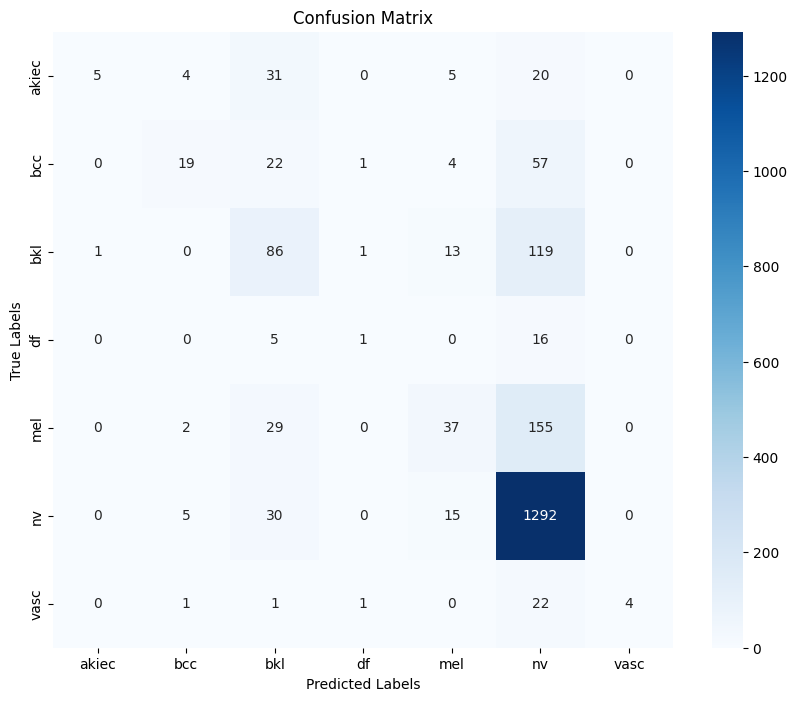

In [33]:
from sklearn.metrics import confusion_matrix, classification_report
import numpy as np

# Step 1: Get predicted probabilities
y_prob = model.predict(test_generator)

# Step 2: Convert probabilities to predicted class indices
y_pred = np.argmax(y_prob, axis=1)

# Step 3: Get true labels from the generator
y_true = test_generator.classes

# Step 4: Get label names from generator
labels = list(test_generator.class_indices.keys())

# Step 5: Print Classification Report
print("Classification Report:\n")
print(classification_report(y_true, y_pred, target_names=labels))

# Step 6: Plot Confusion Matrix
conf_mat = confusion_matrix(y_true, y_pred)

plt.figure(figsize=(10, 8))
sns.heatmap(conf_mat, annot=True, fmt='d', cmap='Blues', xticklabels=labels, yticklabels=labels)
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.title('Confusion Matrix')
plt.show()